# 1. Business Understanding 
## 1.1 Background 

Les etudiant s universitaire sont confrontes a de nombreux defis pouvant affecter leur sante physique et mental. La charge academique, les habitudes de sommeil irregulieres, la sedantarite, l'utilisation intensive des ecrans, une alimentation desequilibre ainsi que les stress psychologique peuvent progressivement degrader leur etat de sante.

Comprendre les interactions entre ces differents facteurs est devenu une priorite pour les etabliessement d'enseignement superieur souhaitant ameliorer les bien-etre de leur etudiants et mettre en place des politiques de prevention efficaces. 

Dans ce contexte, le ML permet d'analyses simultanement un grand nombre de variable comportemental, physiologique et spychologique afin d'identifier les principaux facteurs associes aux different niveaux de sante.

## 1.2 Dataset Overview

Le jeu de donnee mise au notre disposition **College Student Health Behavior Dataset** contient environ **50 000 obeservations** representant les habitudes de vie et les indicateur de sante d'etudiant universitaires.

Les dataset a ete construit a partir de tendance observes dans plusieurs etudes a sur la sante des etudiants en Chine. Les donnees ont ete synthetisees afin de reproduire des comportement realiste observes dans les environnements universitaire modernes.

Chaque observation correspond a un etudiant a un instant donne et rassemble plusieurs categories d'informations : 
- Habitude de vie (Activite physique, sommeil, alimentation, consommation d'eau, temps d'ecran...)
- Indicateurs physiologiques (IMC, Frequence Cardiaque, Calorie brulees...)
- Indicateur psychologiques  (stress, anxiete, fatigue...)
- Information temporelle permettant de suivre l'evolution des comportements.

## 1.3 Business Problem

Les universite disposent aujourd'hui de nombreuses donnees sur leurs etudiant mais il rest difficile d'identifier rapidement les individus presentant un risque eleve de degradation de leur etat de sante.

Une detection precoce permettrait : 
- De proposer des actions de prevention personnalisees; 
- d'ameliorer les performances academiques grace a un meilleur suivi du bien-etre;
- de reduire les risques lies aux problems de sante physique et mental; 
- d'orienter les ressource medicale vers les etudiant les plus vulnerable 
- d'adapter le rythme academique en fonction des etudiants
- d'organiser les contenues academiques en fonctions de l'age, du niveau academiques et d'autre parametres.
- D'avir connaissance des elements academiques qui influence psycologiquement les etudiants de les reguler

L'objectif est donc de construire un model capable de predire le niveau de sante d'un etudiant a partir de ses habitudes quotidiennes et de ses caracteristiques physiologiques et psychologique

## 1.4 Machine Learning Problem

Les problemes de ML dont il est question ici est une **classification superviser multiclasse** car chaque etudiant apartient a une seule et unique categorie de sante : 
- **Fit :** L'etudiant est en bonne sante
- **At-Risk :** Le rythme de vie de l'etudiant comporte des risques
- **Unhealthy :** L'etudiant fait face a des problemes de sante comportementaux

A partir des variable explicatiove disponibles, le model devra apprendre comme suite : 
\[f(X) = y\]

ou : 
- \(X\) represente l'ensemble des variables decrivant un etudiant; 
- \(y\) represente sa categorie de sante dans la variable cible

## 1.5 Project Objectives 
De part nos objectif d'etre a la fois precis sur ce que l'on fait tel un ML ingenieur nous poursuivons dans ce projet 2  objectifs specifique : 

### Business Objectif 
- Comprendre quels facteur influence le plus l'etat de sante des etudiants. 
- Identifier les profils les plus a risques 
- Fournir des recommandation permettant d'ameliorer le bien-etre etudiants.

### Machine Learning Objectif 
- Construire un model capable de predire correctement le categorie de sante d'un etudiant 
- Comparer plusieurs algorithme de classification 
- optimiser leur hyperparametres 
- interpreter les decision du model 

# 2. Data Collection

## 2.1 Dataset Source

Cette etude est basee sur le **College Student Health Behavior Dataset**, publie sur Kaggle par **Ziya**.

Le dataset original, intitule **`enhanced_student_health_dataset_50k.xlsx`**, contient 50 000 observations decrivant les habitudes de vie et les indicateurs de sante d'etudiants universitaires.

Pour cette competition, les organisateurs ont fourni une version derivee du dataset original afin de construire la tâche de prediction. Cette version sera utilisee tout au long de cette etude.

Les principales informations fournies sont resumees ci-dessous.

| Property | Value |
|----------|-------|
| Dataset Name | College Student Health Behavior Dataset |
| Author | Ziya |
| Platform | Kaggle |
| License | CC0: Public Domain |
| Usability Score | 8.82 / 10 |
| Expected Update Frequency | Annually |
| Tags | Data Analytics, Data Cleaning |

La licence **CC0 (Public Domain)** autorise librement l'utilisation, la modification et la redistribution des donnees sans restriction, ce qui en fait un jeu de donnees particulierement adapte aux projets de recherche et d'apprentissage en Data Science.

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import missingno as msno
from IPython.display import display
import seaborn as sns
import numpy as np
import itertools
import math

/home/mary/.local/lib/python3.12/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
original = pd.read_csv("enhanced_student_health_dataset_50k.xls")

train

,id,health_condition,sleep_duration,heart_rate,bmi,calorie_expenditure,step_count,exercise_duration,water_intake,diet_type,stress_level,sleep_quality,physical_activity_level,smoking_alcohol,gender
0,0,unhealthy,5.22,70.6,25.66,2174.0,1326.0,19.8,1.86,veg,high,average,sedentary,yes,female
1,1,at-risk,5.53,71.3,25.84,1966.0,9891.0,49.9,1.26,non-veg,low,average,moderate,yes,other
2,2,unhealthy,5.29,75.4,24.54,2688.0,14216.0,38.1,1.60,veg,high,poor,active,yes,male
3,3,unhealthy,4.70,77.2,23.13,2630.0,7174.0,59.9,2.02,veg,high,average,active,occasional,female
4,4,at-risk,7.23,73.4,28.44,2560.0,6584.0,46.0,2.25,veg,NaN,average,sedentary,NaN,male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
690083,690083,at-risk,6.31,69.7,24.11,2157.0,NaN,30.8,3.00,non-veg,high,poor,active,yes,female
690084,690084,at-risk,5.78,54.0,26.36,2858.0,6488.0,52.4,1.46,veg,medium,average,moderate,no,male
690085,690085,fit,7.64,85.7,21.91,2195.0,9241.0,41.3,1.57,non-veg,NaN,average,active,no,male
690086,690086,at-risk,6.74,73.0,18.73,2061.0,13366.0,56.6,2.60,balanced,NaN,average,active,yes,male


In [3]:
print(f"la dimension du train set est de :",train.shape)
print(f"la dimension du test set est de :",test.shape)
print(f"la dimension du dataset original est de :",original.shape)

la dimension du train set est de : (690088, 15)
la dimension du test set est de : (295753, 14)
la dimension du dataset original est de : (50000, 22)


## 2.2 Dataset Used in This Competition 

Le jeu de donnees origignatl presente par l'auteur est le fiche **`enhanced_student_health_dataset_50k.xlsx`**, contenant **50 000 observations** et **22 variables**.

Cependant, dans le cadre de cette competitions Kaggle, les organisateur fournissent une version differente du dataset, specifiquement preparee pour les tache de prediction 

les fichier mis a disposition des Kaggeler sont : 
| Dataset | Observations | Variables |
|----------|-------------:|----------:|
| Train Set | 690 088 | 15 |
| Test Set | 295 753 | 14 |

- certaines variables du jeu de donnees original ont ete supprimees ;
- le nombre d'observations a ete considerablement augmente ;
- seule la variable cible (`health_condition`) est absente du jeu de test, conformement aux regles habituelles des competitions Kaggle.

Par consequent, toutes les analyses realisees dans ce projet porteront exclusivement sur les donnees fournies dans le cadre de la competition.

In [4]:
print(f"Les differentes information concernant les variables de notre dataset \n : ")
train.info()

Les differentes information concernant les variables de notre dataset 
 : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 690088 entries, 0 to 690087
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   id                       690088 non-null  int64  
 1   health_condition         690088 non-null  object 
 2   sleep_duration           614089 non-null  float64
 3   heart_rate               682255 non-null  float64
 4   bmi                      676190 non-null  float64
 5   calorie_expenditure      637235 non-null  float64
 6   step_count               676172 non-null  float64
 7   exercise_duration        683187 non-null  float64
 8   water_intake             646611 non-null  float64
 9   diet_type                683187 non-null  object 
 10  stress_level             607277 non-null  object 
 11  sleep_quality            631757 non-null  object 
 12  physical_activity_level  653467 non-nul

## 2.3 train set Dimension 
Examinons prealablement la taille du jeu de donnees.

- Nombre d'observations : **690 088**
- Nombre de variables : **15**

Parmi ces variables :

- 1 identifiant (`id`)
- 1 variable cible (`health_condition`)
- 13 variables explicatives.

## 2.4 Variable Categories

Les variables peuvent etre regroupees selon leur nature.

### Identifier

- id

### Target Variable

- health_condition

### Lifestyle Features

- sleep_duration
- calorie_expenditure
- step_count
- exercise_duration
- water_intake
- diet_type
- physical_activity_level

### Physiological Features

- bmi
- heart_rate

### Psychological Features

- stress_level
- sleep_quality

### Behavioral Features

- smoking_alcohol

### Demographic Features

- gender

# 3. Data Quality Assessment

Avant d'appliquer les technique de nettoyage et de pretraitement, il est indispensable de realise tout a d'abord l'audit de nos donnees, afin d'identifier les eventuelles anomalies susceptibles d'affecter les analyses statistique ou les performation des modeles de ML. 

l'objectif est de repondre a plusieurs questions essentielles : 
- Valeur manquante 
- Incoherence des types des donnees 
- Valeur duplique 
- Outliers
- Variable desequilibres

Les anomalies identifiees dans cette etape guideront les decisions prises lors des phases de **Data Cleaning** et de **Data Preprocessing**.

# 3.1 Dataset structure 
Le jeu de donnees d'entrainement contient **690 088 observations** reparties sur **15 variables**, pour une empreinte memoire d'environs **79 Mo**

Les variables se repartissent comme suit : 
- **07 variables numeriques** (`float64`), correspondant principalement a des mesure physiologique ou a des indicateur lies au mode de vie. 
- **07 variables categorielles** (`object`), decrivant des caracteristiques comportementales, psychologique.
- **1 variable entiere** (`int64`), correspondant a l'identifiant unique (`id`).

La structure generale du jeu de donnees est coherente avec les probleme etudies.

In [5]:
train_num = train.drop(['id'],axis=1).select_dtypes(include=["int64", "Float64"])
train_cat = train.drop(['id'],axis=1).select_dtypes(include=["object"])

train_num_col = train_num.columns.to_list()
train_cat_col = train_cat.columns.to_list()

## 3.2 Data Types Assessment

Les variables numeriques identifiees sont :

- `sleep_duration`
- `heart_rate`
- `bmi`
- `calorie_expenditure`
- `step_count`
- `exercise_duration`
- `water_intake`

Les variables categorielles sont :

- `health_condition`
- `diet_type`
- `stress_level`
- `sleep_quality`
- `physical_activity_level`
- `smoking_alcohol`
- `gender`

La variable `id` constitue un identifiant unique des observations. Elle ne possede pas de valeur predictive et sera exclue de la phase d'apprentissage.

Aucune incoherence de typage n'a ete observee. Les types de donnees sont conformes a la nature des variables et aucune conversion n'est necessaire a ce stade.



In [6]:
# Les donnees sont-elles completes ?
    # Cherchons les totals des valeurs manquantes 
missing_values = train.isnull().sum()

    # Pourcentage de chaque valeur manquante par variable
missing_percentage = (missing_values/len(train)) * 100

missing_total = pd.DataFrame({
    "Missing values" : missing_values,
    "Percentage (%)" : missing_percentage
}).sort_values(by="Percentage (%)", ascending=False)

print(missing_total[missing_total["Missing values"]>0])

                         Missing values  Percentage (%)
stress_level                      82811       12.000064
sleep_duration                    75999       11.012943
sleep_quality                     58331        8.452690
calorie_expenditure               52853        7.658878
water_intake                      43477        6.300211
physical_activity_level           36621        5.306715
smoking_alcohol                   28582        4.141791
gender                            21373        3.097141
step_count                        13916        2.016554
bmi                               13898        2.013946
heart_rate                         7833        1.135073
diet_type                          6901        1.000017
exercise_duration                  6901        1.000017


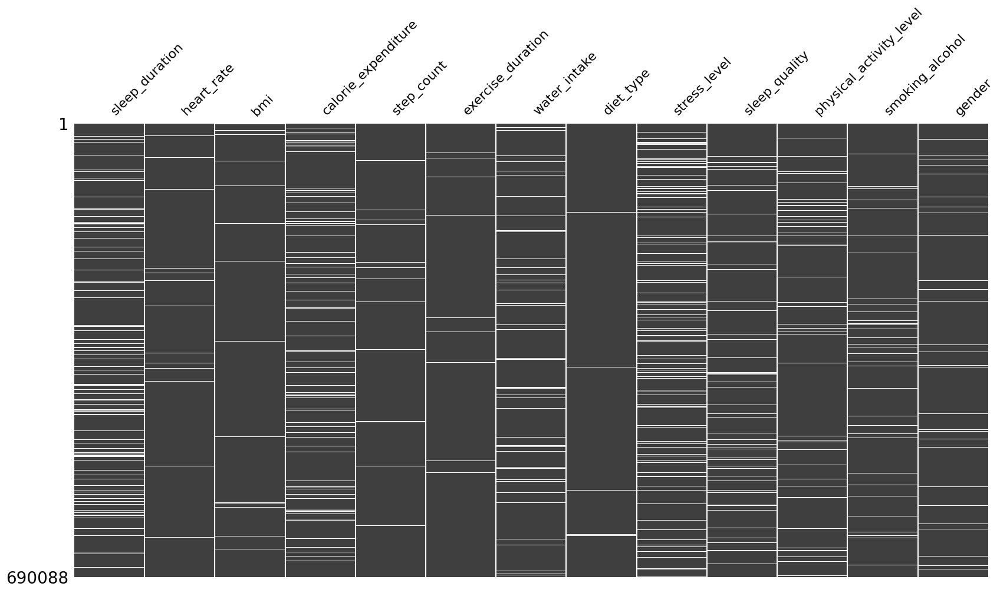

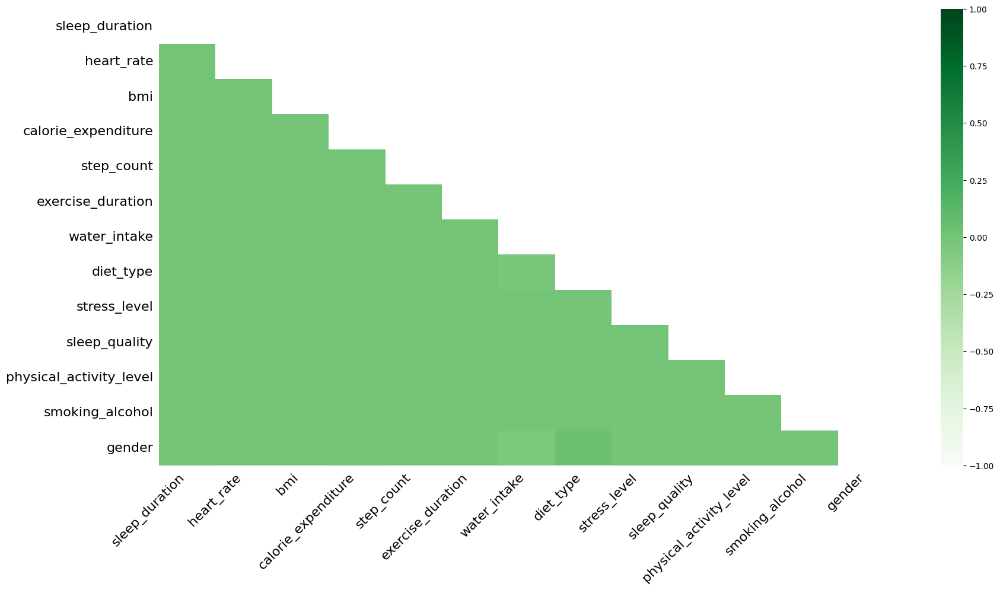

In [7]:
msno.matrix(train.drop(['id', 'health_condition'], axis=1), figsize=(20,10),sparkline=False)
msno.heatmap(train.drop(['id', 'health_condition'], axis=1), figsize=(20,10), cmap="Greens")

plt.show()


## 3.3 Missing Values Analysis

L'analyse revele la presence de valeurs manquantes dans **13 des 15 variables**. Seules les colonnes `id` et `health_condition` sont entierement completes.

La variable la plus affectee est `stress_level`, avec **82 811 valeurs manquantes** (**12,00 %**), suivie de `sleep_duration` (**11,01 %**) et `sleep_quality` (**8,45 %**).

a l'inverse, certaines variables presentent un faible taux de valeurs manquantes, comme `heart_rate` (**1,14 %**) ou `exercise_duration` (**1,00 %**).

La visualisation realisee a l'aide de **Missingno** montre que ces valeurs manquantes sont reparties de maniere aleatoire dans le jeu de donnees. Aucun motif particulier ni dependance structurelle n'a ete observe.

In [8]:
# Nombre de lignes dupliquees au total
row_duplicated = train.duplicated().sum()
percentage_duplicates = (row_duplicated / len(train)) * 100

print(f"Lignes dupliquees : {row_duplicated} ({percentage_duplicates:.2f}%)")

Lignes dupliquees : 0 (0.00%)


## 3.4 Duplicate Records Analysis

La recherche de doublons montre qu'aucun enregistrement duplique n'est present dans le jeu de donnees.

Chaque ligne correspond donc à une observation unique et aucune suppression de doublons ne sera necessaire lors du nettoyage des donnees.


In [9]:
# Variable absurde
train.drop(['id'], axis=1).describe()

,sleep_duration,heart_rate,bmi,calorie_expenditure,step_count,exercise_duration,water_intake
count,614089.000000,682255.000000,676190.000000,637235.000000,676172.000000,683187.000000,646611.000000
mean,6.992597,75.096504,22.984925,2226.084931,8615.953050,38.751456,2.188542
std,1.215407,8.175106,2.481787,347.532098,3929.399831,14.742189,0.518489
min,3.000000,50.000000,16.000000,1200.000000,1002.000000,0.000000,0.500000
25%,6.160000,69.400000,21.320000,2053.000000,5389.000000,29.200000,1.840000
50%,6.990000,75.100000,22.990000,2241.000000,8856.000000,39.400000,2.170000
75%,7.810000,80.700000,24.660000,2456.000000,12114.000000,49.400000,2.500000
max,10.000000,107.700000,34.820000,3580.000000,14999.000000,99.800000,4.720000


## 3.5 Invalid Value Assement 

Les statistiques descriptive des variables numeriques montre que les observation evoluent dans des intervalles compatibles avec les caracteristiques attentues d'une population etudiante.

les principaux plages observees sont : 
- `sleep_duration` : **3 à 10 heures**
- `heart_rate` : **50 à 107,7 bpm**
- `bmi` : **16 à 34,82**
- `calorie_expenditure` : **1200 à 3580 kcal**
- `step_count` : **1002 à 14999 pas**
- `exercise_duration` : **0 à 99,8 minutes**
- `water_intake` : **0,5 à 4,72 litres**

Aucun valeur manifestement impossible ou incoherente n'a ete identifiee.

Par ailleurs, la proximite observee entre les moyennes et les medianes de plusieurs variables numeriques (`sleep_duration`, `heart_rate`,`bmi`, `exercise_duration` et `water_intake` )laisse supposer des distributions relativement symetriques. Cette caracteristique sera etudiee plus en detail lors de l'analyse exploratoire des donnees (EDA).


In [10]:
# Exemple pour une colonne numerique
for col in train_num_col:
    Q1 = train[col].quantile(0.25)
    Q3 = train[col].quantile(0.75)
    IQR = Q3 - Q1

    # Valeurs en dehors de 1.5 * IQR
    outliers = train[(train[col] < (Q1 - 1.5 * IQR)) | (train[col] > (Q3 + 1.5 * IQR))]
    print(f"Nombre d'outliers detectes dans",col, ":", {len(outliers)})

Nombre d'outliers detectes dans sleep_duration : {2020}
Nombre d'outliers detectes dans heart_rate : {2825}
Nombre d'outliers detectes dans bmi : {5352}
Nombre d'outliers detectes dans calorie_expenditure : {12831}
Nombre d'outliers detectes dans step_count : {0}
Nombre d'outliers detectes dans exercise_duration : {104}
Nombre d'outliers detectes dans water_intake : {11388}


## 3.6 Outlier Assessment

La detection des valeurs aberrantes met en evidence une presence valeur non-normale les variables numeriques.

Les variables les plus concernees sont :

- `calorie_expenditure` : **12 831** valeurs aberrantes
- `water_intake` : **11 388**
- `bmi` : **5 352**
- `heart_rate` : **2 825**
- `sleep_duration` : **2 020**

À l'inverse, `step_count` ne presente aucun outlier detecte, tandis que `exercise_duration` n'en contient que **104**.

La presence de valeurs aberrantes ne signifie pas necessairement qu'il s'agit d'erreurs de mesure. Certaines observations peuvent correspondre à des comportements reels mais peu frequents, comme des etudiants tres sportifs ou, au contraire, tres sedentaires.

In [11]:
def cat_analyser(dataset, col_cat):
    for col in col_cat:
        print(f"Verifions la colone : {col}")
        eff = dataset[col].value_counts(dropna=False)
        percentage = dataset[col].value_counts(normalize=True, dropna=False) * 100

        combine = pd.DataFrame({
            'effectif' : eff,
            'percentage (%)' : percentage.round(2)
        })

        display(combine)
        print("\n" + "="*45 + "\n")

cat_analyser(train_cat, train_cat_col)

Verifions la colone : health_condition


,effectif,percentage (%)
health_condition,,
at-risk,592561,85.87
unhealthy,57724,8.36
fit,39803,5.77




Verifions la colone : diet_type


,effectif,percentage (%)
diet_type,,
veg,231432,33.54
balanced,226888,32.88
non-veg,224867,32.59
NaN,6901,1.00




Verifions la colone : stress_level


,effectif,percentage (%)
stress_level,,
medium,261819,37.94
high,177750,25.76
low,167708,24.30
NaN,82811,12.00




Verifions la colone : sleep_quality


,effectif,percentage (%)
sleep_quality,,
average,213948,31.00
poor,212166,30.74
good,205643,29.80
NaN,58331,8.45




Verifions la colone : physical_activity_level


,effectif,percentage (%)
physical_activity_level,,
moderate,221041,32.03
sedentary,219784,31.85
active,212642,30.81
NaN,36621,5.31




Verifions la colone : smoking_alcohol


,effectif,percentage (%)
smoking_alcohol,,
yes,223730,32.42
no,219791,31.85
occasional,217985,31.59
NaN,28582,4.14




Verifions la colone : gender


,effectif,percentage (%)
gender,,
male,237756,34.45
female,224016,32.46
other,206943,29.99
NaN,21373,3.10


## 3.7 Categorical Variables Assessment

L'analyse des variables categorielles montre une repartition relativement homogene des differentes modalites.

Les variables `diet_type`, `physical_activity_level`, `smoking_alcohol` et `gender` presentent des proportions comparables entre leurs differentes modalites, ce qui constitue un avantage pour les futurs modeles de Machine Learning.

Les variables `stress_level` et `sleep_quality` affichent egalement une distribution equilibree entre leurs differentes modalites, malgre la presence de valeurs manquantes.

Aucune modalite incoherente ou inattendue n'a ete observee parmi les variables categorielles.



## 3.8 Target Variable Assessment

La variable cible `health_condition` presente une distribution fortement desequilibree.

La classe **At-Risk** represente **85,87 %** des observations, contre seulement **8,36 %** pour **Unhealthy** et **5,77 %** pour **Fit**.

Ce desequilibre est susceptible d'influencer l'apprentissage des modeles de classification. 

# 4. Data analysis and EDA

## 4.1 Cleaning variable-by-variable 

Pour le nettoyage des valeur manquante concernant les variables numeriques nous allons procede variables apres variables. Car si nous voulons imputer les valeurs manquante par la moyens puis calculer les outliers, la oyens sera influencer par les valeur extreme des outliers.

De meme si on supprime les outliers avant d'imputer, cela pourra influencer la distributions de la variable.

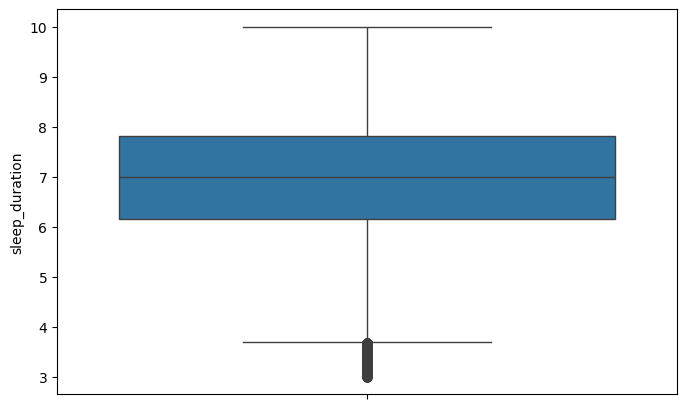

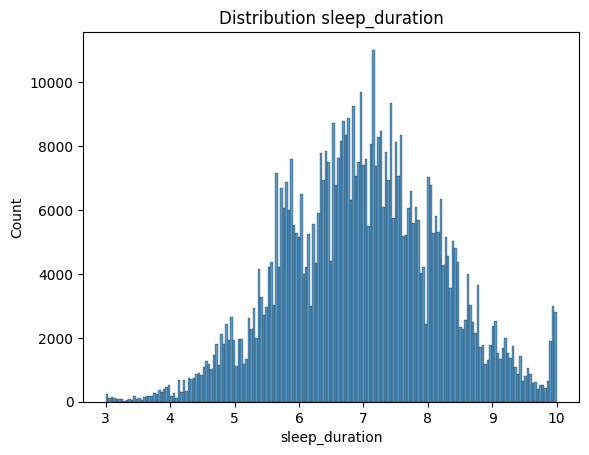

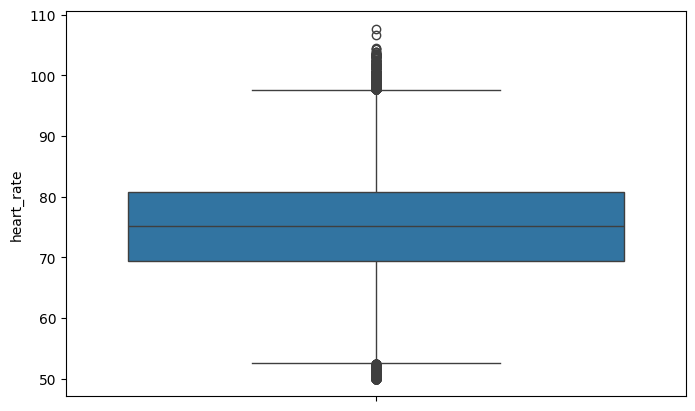

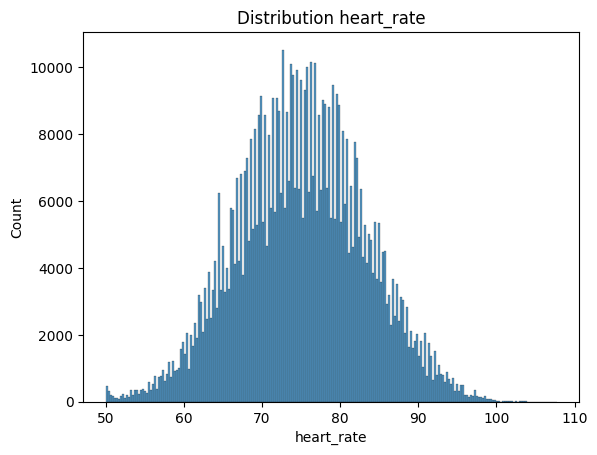

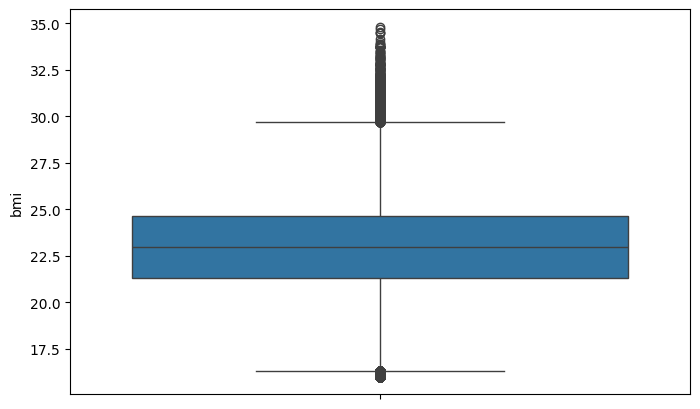

...

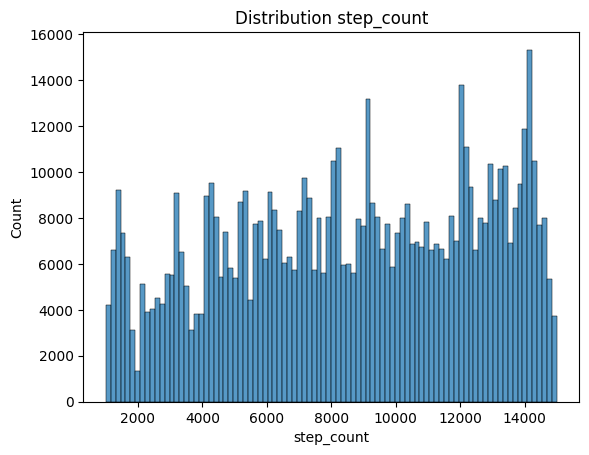

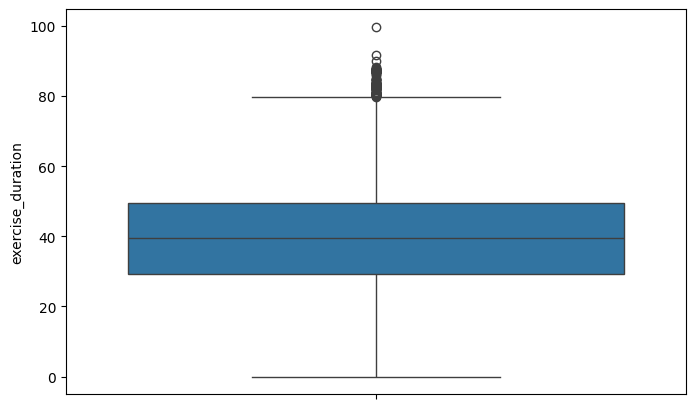

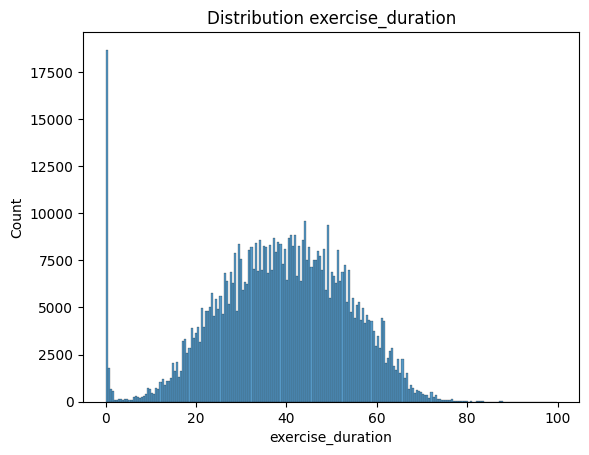

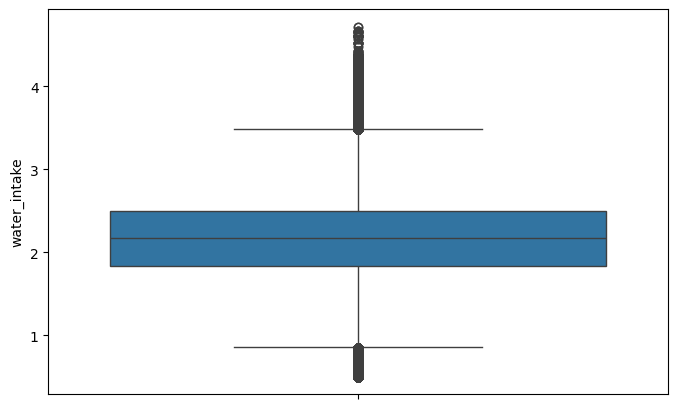

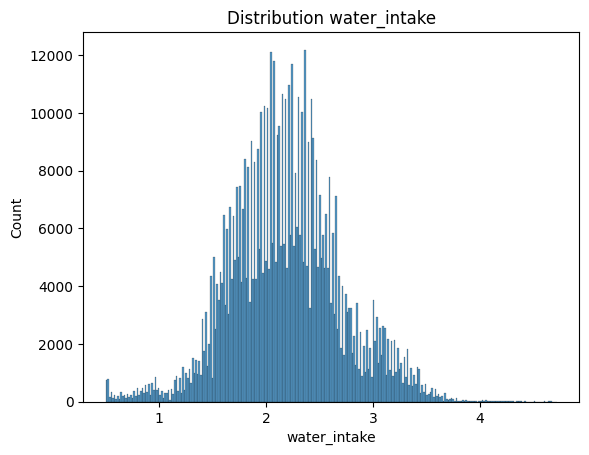

In [12]:
# Affichons les distribution et les boxplot de tous les variable numerique 
for col1 in train_num_col:
    plt.figure(figsize=(8, 5))
    sns.boxplot(data=train_num[col1])
    plt.show()
    sns.histplot(data=train_num[col1])
    plt.title(f'Distribution {col1}')
    plt.show()

In [13]:
for skew in train_num_col:
    print(f"le Skewness { skew} =  {train_num[skew].skew()}")
    print()
    print(f"le kurotsis { skew} =  {train_num[skew].kurtosis()}")

le Skewness sleep_duration =  -0.00823233899896683

le kurotsis sleep_duration =  -0.11445104707915732
le Skewness heart_rate =  0.0004382013061367681

le kurotsis heart_rate =  -0.18670818738750317
le Skewness bmi =  0.024639760001979885

le kurotsis bmi =  -0.02808125061337652
le Skewness calorie_expenditure =  -0.1839399892368627

le kurotsis calorie_expenditure =  -0.06262850531136799
le Skewness step_count =  -0.18023843603832704

le kurotsis step_count =  -1.1148790599883853
le Skewness exercise_duration =  -0.3746098024470961

le kurotsis exercise_duration =  0.03465360952534846
le Skewness water_intake =  0.10996029570066149

le kurotsis water_intake =  0.4942917163887204


### Numerical Missiong Values Imputation 

Au vu des visualisations (box-plot et histogramme) et du resultat des skewness nous pouvons tirer les resultats suivant :

| Variable | Missing (%) | Outliers | Skewness | Kurtosis | Distribution Analysis | Recommended Imputation |
|----------|------------:|---------:|----------:|----------:|----------------------|------------------------|
| `sleep_duration` | 11.01 | 2 020 | -0.008 | -0.114 | Très symétrique, proche d'une distribution normale. | Mean |
| `heart_rate` | 1.14 | 2 825 | 0.000 | -0.187 | Distribution approximativement parfaitement symétrique, légèrement aplatie. | Mean |
| `bmi` | 2.01 | 5 352 | 0.025 | -0.028 | Distribution très proche d'une loi normale. | Mean |
| `calorie_expenditure` | 7.66 | 12 831 | -0.184 | -0.063 | Légère asymétrie négative mais distribution globalement symétrique. | Mean |
| `step_count` | 2.02 | 0 | -0.180 | -1.115 | Distribution symétrique. | Mean |
| `exercise_duration` | 1.00 | 104 | -0.375 | 0.035 | Distribution légèrement asymétrique à gauche mais proche de la normale. | Mean |
| `water_intake` | 6.30 | 11 388 | 0.110 | 0.494 | Distribution légèrement plus concentrée autour de la moyenne. | Mean |

On peut dont decide sans l'ombre de se tromper de remplacer les valeur manquand pour les donnees numeriques par le moyenne.

In [14]:
train_num_cleaned = train_num.fillna(train_num.mean())
train_num_cleaned.describe()

,sleep_duration,heart_rate,bmi,calorie_expenditure,step_count,exercise_duration,water_intake
count,690088.000000,690088.000000,690088.000000,690088.000000,690088.000000,690088.000000,690088.000000
mean,6.992597,75.096504,22.984925,2226.084931,8615.953050,38.751456,2.188542
std,1.146529,8.128577,2.456669,333.958474,3889.578754,14.668292,0.501891
min,3.000000,50.000000,16.000000,1200.000000,1002.000000,0.000000,0.500000
25%,6.300000,69.500000,21.380000,2068.000000,5460.000000,29.300000,1.870000
50%,6.992597,75.096504,22.984925,2226.084931,8697.000000,39.200000,2.188542
75%,7.680000,80.600000,24.630000,2438.000000,12089.000000,49.300000,2.470000
max,10.000000,107.700000,34.820000,3580.000000,14999.000000,99.800000,4.720000


In [15]:
train_num.describe()

,sleep_duration,heart_rate,bmi,calorie_expenditure,step_count,exercise_duration,water_intake
count,614089.000000,682255.000000,676190.000000,637235.000000,676172.000000,683187.000000,646611.000000
mean,6.992597,75.096504,22.984925,2226.084931,8615.953050,38.751456,2.188542
std,1.215407,8.175106,2.481787,347.532098,3929.399831,14.742189,0.518489
min,3.000000,50.000000,16.000000,1200.000000,1002.000000,0.000000,0.500000
25%,6.160000,69.400000,21.320000,2053.000000,5389.000000,29.200000,1.840000
50%,6.990000,75.100000,22.990000,2241.000000,8856.000000,39.400000,2.170000
75%,7.810000,80.700000,24.660000,2456.000000,12114.000000,49.400000,2.500000
max,10.000000,107.700000,34.820000,3580.000000,14999.000000,99.800000,4.720000


La statistique descriptive montre qu'il ya peut d'ecart entre les valeurs avant l'imputation et les valeur apres l'imputation

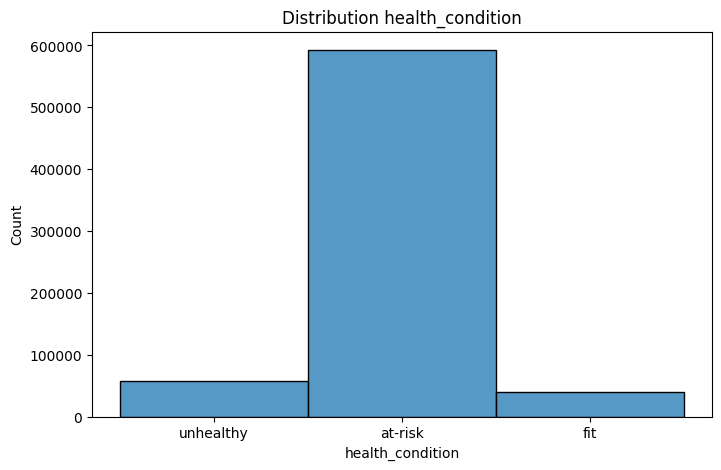

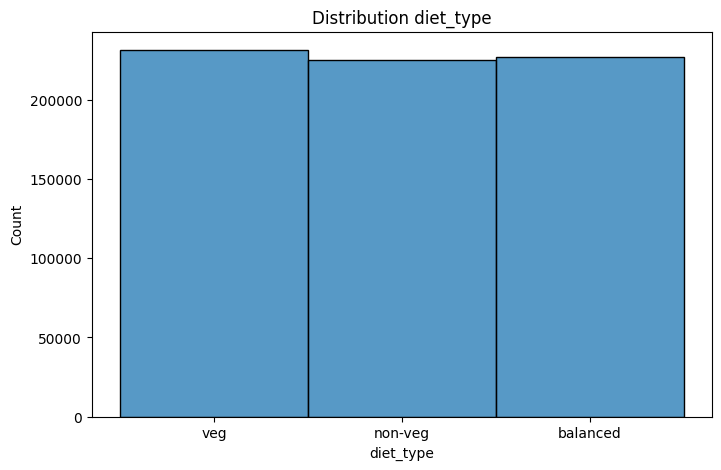

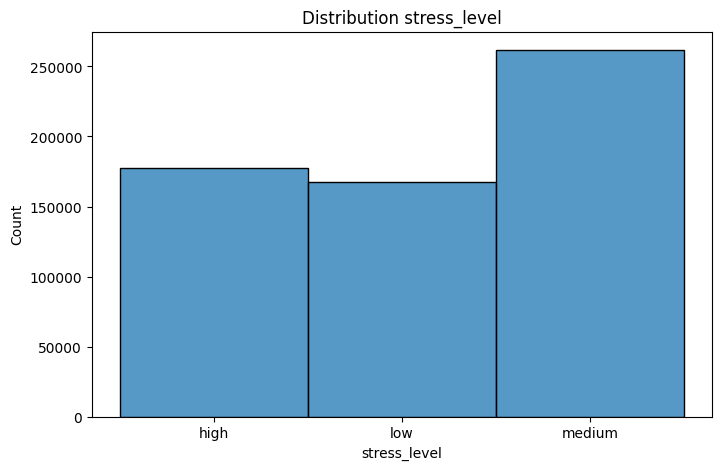

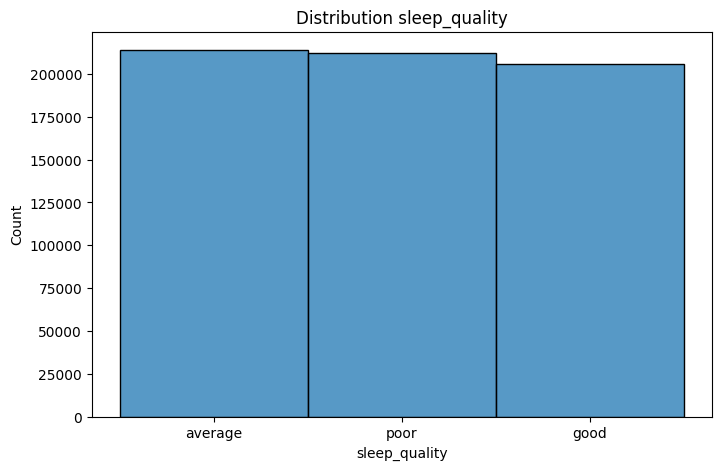

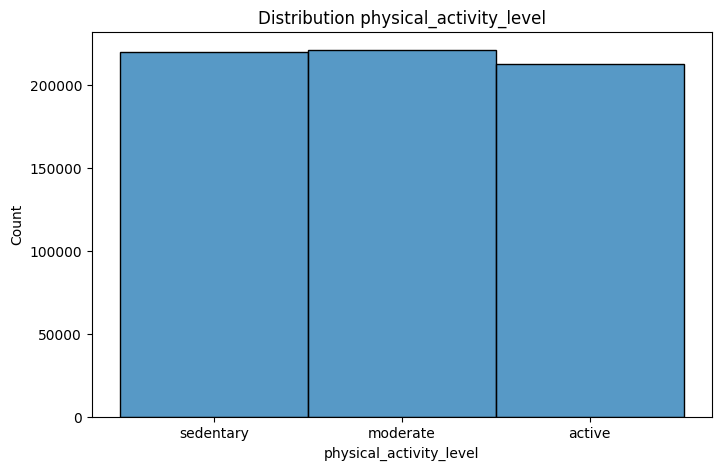

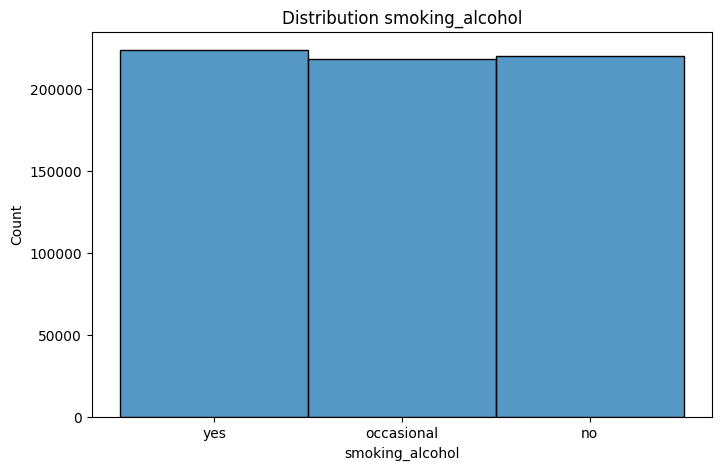

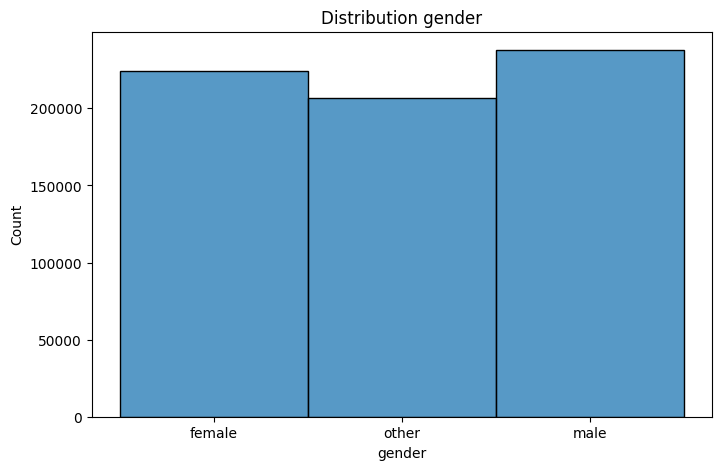

In [16]:
# Affichons les distribution et les boxplot de tous les variable categorielle
for col1 in train_cat_col:
    plt.figure(figsize=(8, 5))
    sns.histplot(data=train_cat[col1])
    plt.title(f'Distribution {col1}')
    plt.show()

In [17]:
for col in train_cat_col:
    if train_cat[col].isnull().sum()>0:
        mode_val = train_cat[col].mode()[0]
        train_cat[col] = train[col].fillna(mode_val)
        train_cat_cleaned = train_cat

train_cat_cleaned

,health_condition,diet_type,stress_level,sleep_quality,physical_activity_level,smoking_alcohol,gender
0,unhealthy,veg,high,average,sedentary,yes,female
1,at-risk,non-veg,low,average,moderate,yes,other
2,unhealthy,veg,high,poor,active,yes,male
3,unhealthy,veg,high,average,active,occasional,female
4,at-risk,veg,medium,average,sedentary,yes,male
...,...,...,...,...,...,...,...
690083,at-risk,non-veg,high,poor,active,yes,female
690084,at-risk,veg,medium,average,moderate,no,male
690085,fit,non-veg,medium,average,active,no,male
690086,at-risk,balanced,medium,average,active,yes,male


### Categorical Missing Values Imputation

Les variables catégorielles présentent un taux relativement faible de valeurs manquantes, compris entre **1 % et 12 %**.

| Variable | Missing Values (%) |
|-------------------------|------------------:|
| `diet_type` | 1.00 % |
| `stress_level` | 12.00 % |
| `sleep_quality` | 8.45 % |
| `physical_activity_level` | 5.31 % |
| `smoking_alcohol` | 4.14 % |
| `gender` | 3.10 % |

Compte tenu de ces faibles proportions, la suppression des observations concernées entraînerait une perte inutile de données, tandis que des méthodes d'imputation plus complexes (KNN, MICE ou modèles prédictifs) augmenteraient considérablement le coût de calcul sans garantir un gain significatif sur un jeu de données de cette taille (près de 700 000 observations).

L'imputation par la **modalité la plus fréquente (mode)** constitue donc une stratégie simple, robuste et largement utilisée pour les variables catégorielles lorsque le pourcentage de valeurs manquantes reste modéré.

Cette méthode présente plusieurs avantages :

- elle conserve l'intégralité des observations ;
- elle est rapide à mettre en œuvre, même sur de grands jeux de données ;
- elle préserve les catégories existantes sans créer de nouvelles modalités artificielles ;
- elle introduit généralement un biais limité lorsque la proportion de valeurs manquantes demeure relativement faible.

Au regard du faible taux de valeurs manquantes observé pour l'ensemble des variables catégorielles, l'imputation par le **mode** a été retenue comme stratégie de nettoyage la plus adaptée dans cette étude.

In [18]:
train_new = pd.concat([train_num_cleaned, train_cat_cleaned], axis=1)
train_new

,sleep_duration,heart_rate,bmi,calorie_expenditure,step_count,exercise_duration,water_intake,health_condition,diet_type,stress_level,sleep_quality,physical_activity_level,smoking_alcohol,gender
0,5.22,70.6,25.66,2174.0,1326.00000,19.8,1.86,unhealthy,veg,high,average,sedentary,yes,female
1,5.53,71.3,25.84,1966.0,9891.00000,49.9,1.26,at-risk,non-veg,low,average,moderate,yes,other
2,5.29,75.4,24.54,2688.0,14216.00000,38.1,1.60,unhealthy,veg,high,poor,active,yes,male
3,4.70,77.2,23.13,2630.0,7174.00000,59.9,2.02,unhealthy,veg,high,average,active,occasional,female
4,7.23,73.4,28.44,2560.0,6584.00000,46.0,2.25,at-risk,veg,medium,average,sedentary,yes,male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
690083,6.31,69.7,24.11,2157.0,8615.95305,30.8,3.00,at-risk,non-veg,high,poor,active,yes,female
690084,5.78,54.0,26.36,2858.0,6488.00000,52.4,1.46,at-risk,veg,medium,average,moderate,no,male
690085,7.64,85.7,21.91,2195.0,9241.00000,41.3,1.57,fit,non-veg,medium,average,active,no,male
690086,6.74,73.0,18.73,2061.0,13366.00000,56.6,2.60,at-risk,balanced,medium,average,active,yes,male


# 5. Data vizualisation
## 5.1 Vizualisation Bivarie

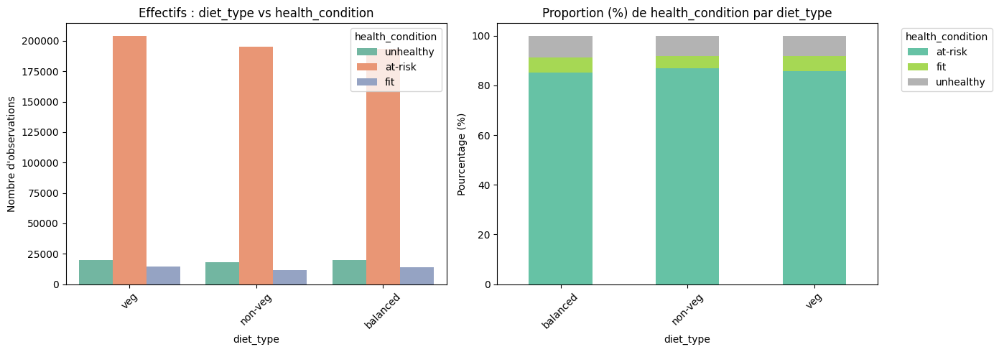

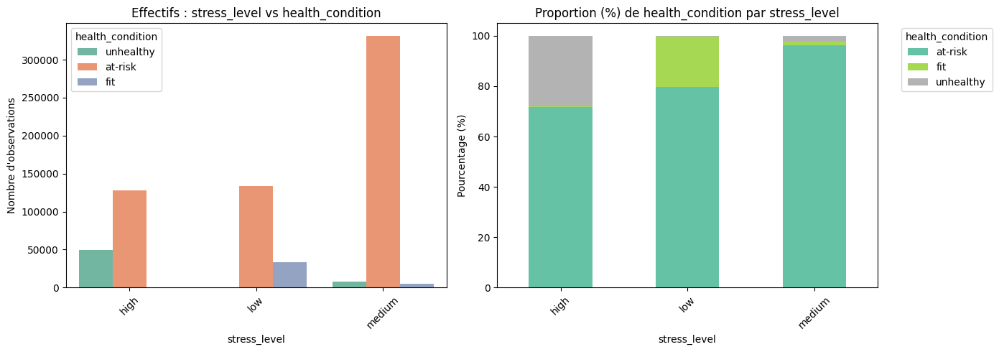

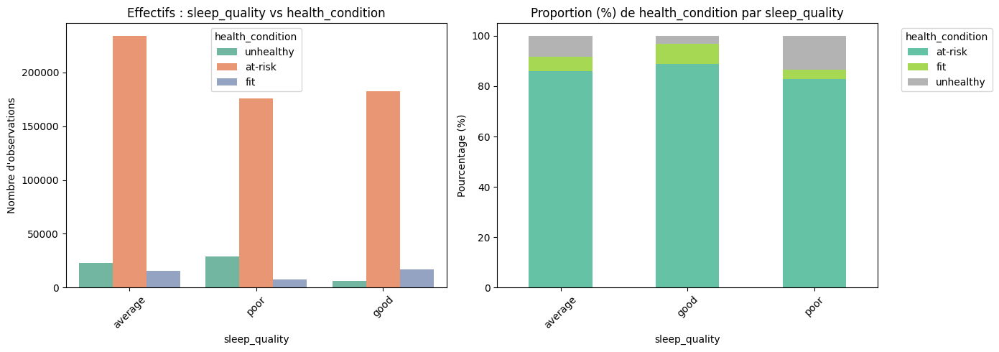

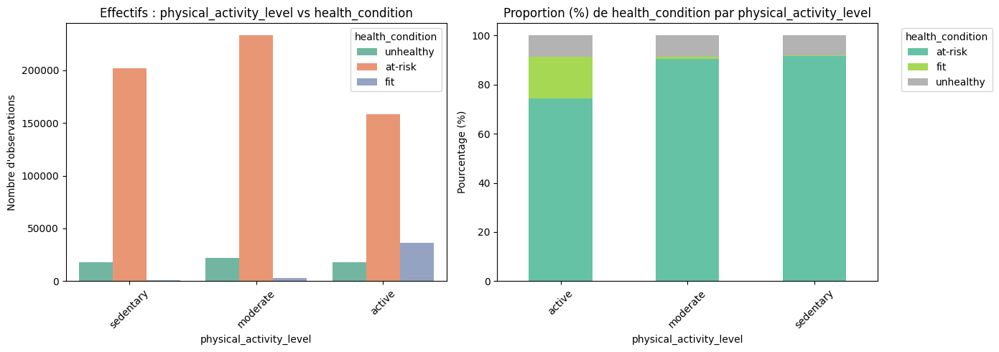

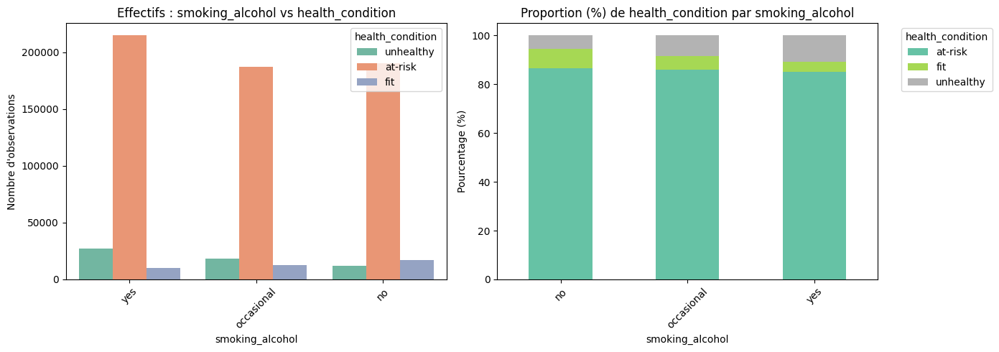

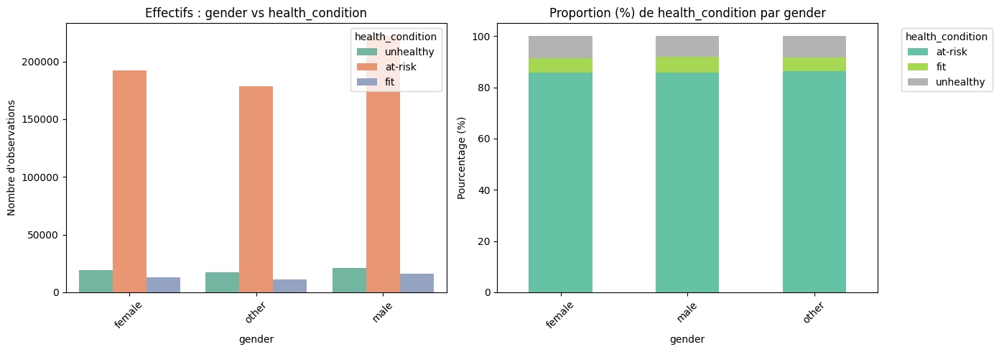

In [19]:
target = 'health_condition'

# Boucle sur la liste de tes variables categorielles
for item in train_cat_col:
    # On evite de comparer la variable cible avec elle-meme si elle est dans la liste
    if item == target:
        continue
        
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # 1. Effectifs bruts (Grouped Bar Chart)
    sns.countplot(data=train_new, x=item, hue=target, palette='Set2', ax=axes[0])
    axes[0].set_title(f'Effectifs : {item} vs {target}')
    axes[0].set_xlabel(item)
    axes[0].set_ylabel('Nombre d\'observations')
    axes[0].tick_params(axis='x', rotation=45)  # Inclination si les noms de categories sont longs

    # 2. Proportions / Pourcentages empiles a 100% (Normalise)
    cross_tab = pd.crosstab(train_new[item], train[target], normalize='index') * 100
    cross_tab.plot(kind='bar', stacked=True, ax=axes[1], colormap='Set2')
    axes[1].set_title(f'Proportion (%) de {target} par {item}')
    axes[1].set_xlabel(item)
    axes[1].set_ylabel('Pourcentage (%)')
    axes[1].legend(title=target, bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[1].tick_params(axis='x', rotation=45)

    # Affichage et nettoyage de chaque figure dans la boucle
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_7026/125378819.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_new, x=target, y=item, palette='Set2', ax=axes[0])


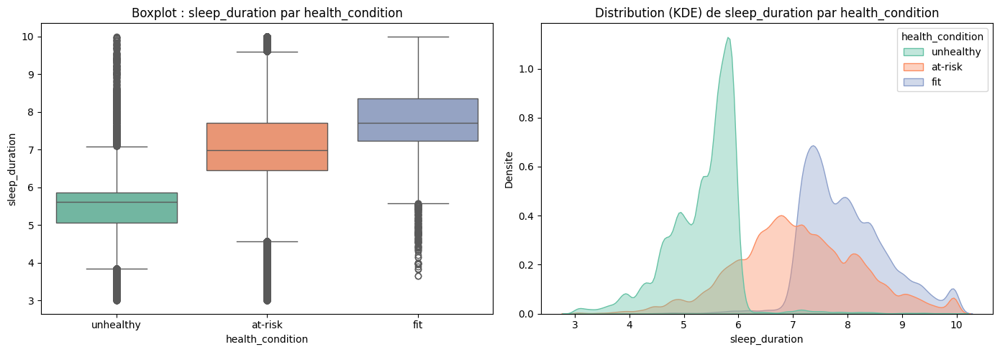

/tmp/ipykernel_7026/125378819.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_new, x=target, y=item, palette='Set2', ax=axes[0])


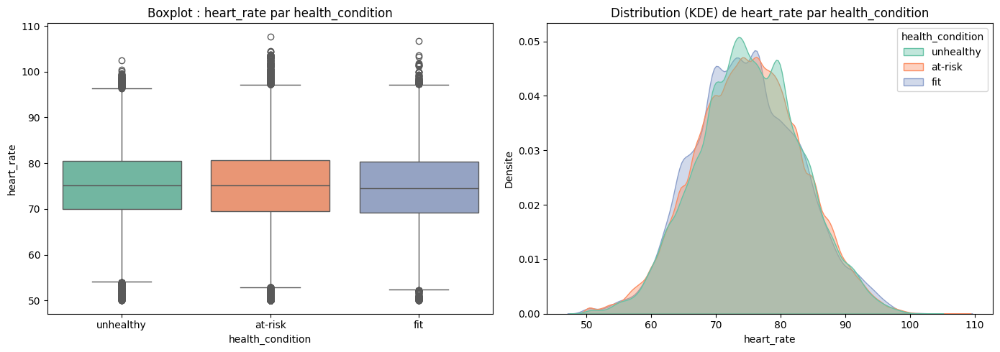

/tmp/ipykernel_7026/125378819.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_new, x=target, y=item, palette='Set2', ax=axes[0])


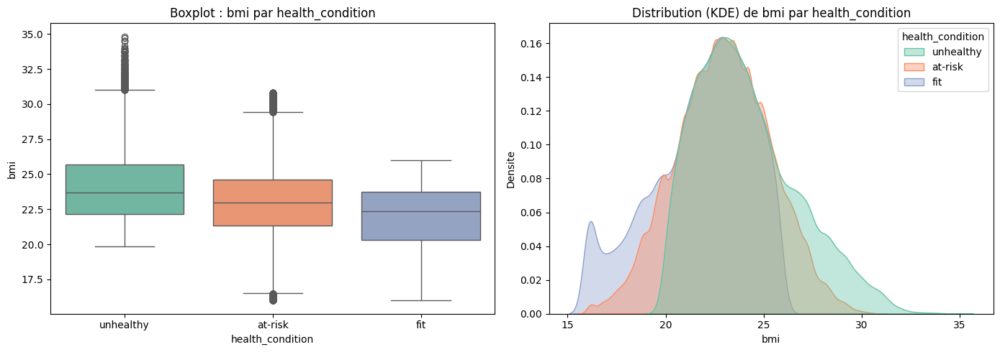

/tmp/ipykernel_7026/125378819.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_new, x=target, y=item, palette='Set2', ax=axes[0])


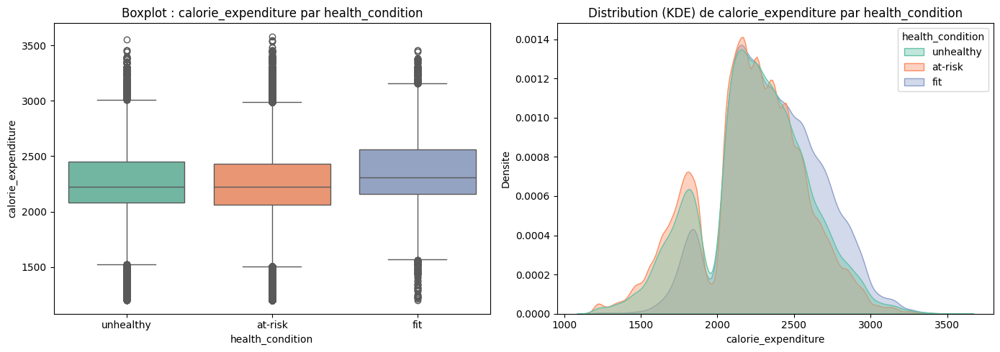

/tmp/ipykernel_7026/125378819.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_new, x=target, y=item, palette='Set2', ax=axes[0])


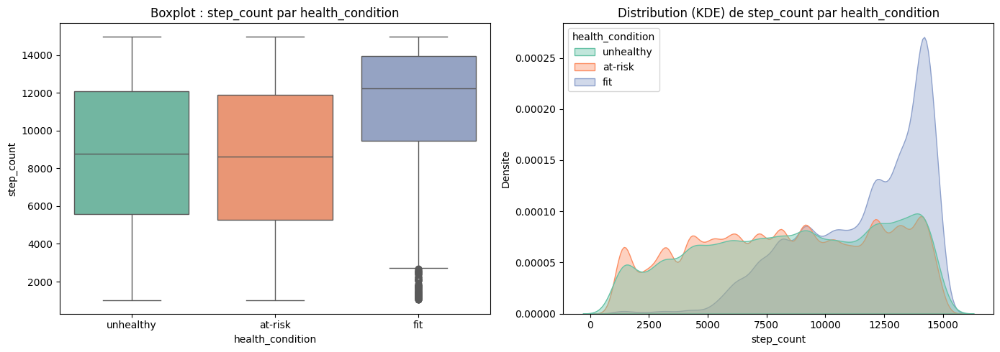

/tmp/ipykernel_7026/125378819.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_new, x=target, y=item, palette='Set2', ax=axes[0])


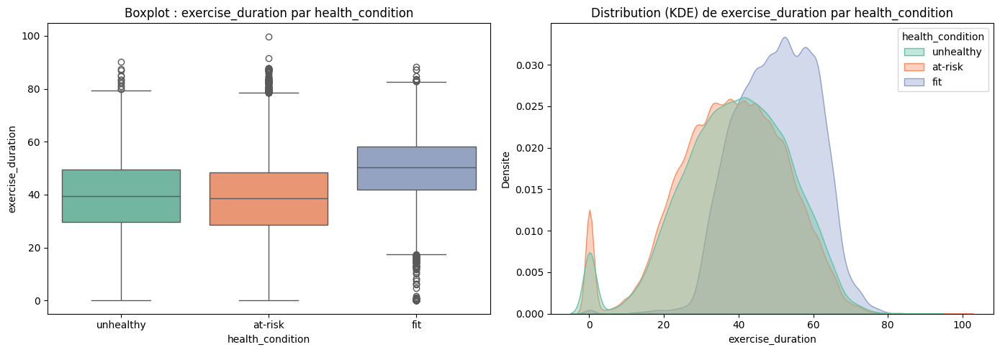

/tmp/ipykernel_7026/125378819.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=train_new, x=target, y=item, palette='Set2', ax=axes[0])


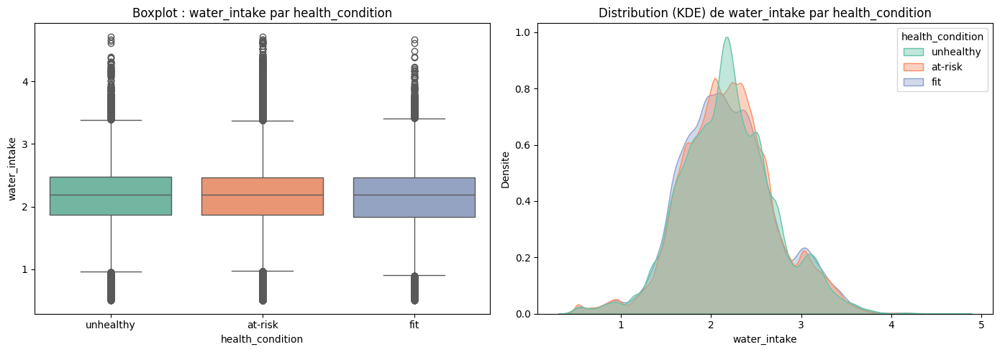

In [20]:
target = 'health_condition'

# Boucle sur la liste de tes variables numeriques
for item in train_num_col:
    # On evite d'inclure la cible si elle est stockee sous forme numerique (ex: 0, 1, 2)
    if item == target:
        continue
        
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # 1. Boxplot (Medianes, quartiles et dispersion par classe)
    sns.boxplot(data=train_new, x=target, y=item, palette='Set2', ax=axes[0])
    axes[0].set_title(f'Boxplot : {item} par {target}')
    axes[0].set_xlabel(target)
    axes[0].set_ylabel(item)

    # 2. KDE plot (Densites de distribution superposees)
    sns.kdeplot(
        data=train, 
        x=item, 
        hue=target, 
        common_norm=False, 
        fill=True, 
        palette='Set2', 
        alpha=0.4, 
        ax=axes[1]
    )
    axes[1].set_title(f'Distribution (KDE) de {item} par {target}')
    axes[1].set_xlabel(item)
    axes[1].set_ylabel('Densite')

    # Affichage propre de chaque graphique dans la boucle
    plt.tight_layout()
    plt.show()

## 5.2 Visualization bivarie for the numerical value

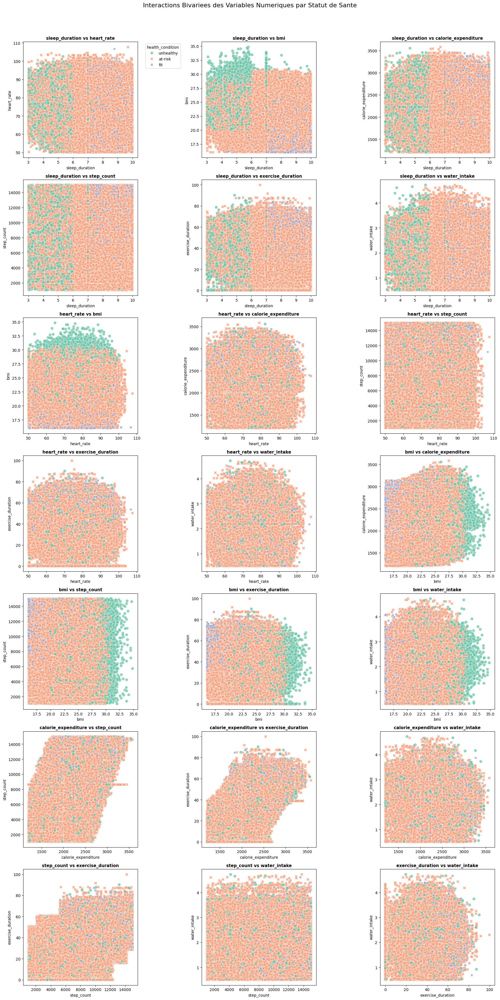

In [21]:
target = 'health_condition'

# 1. Selection uniquement des variables numeriques (en excluant la target)
features_num = [col for col in train_num_col if col != target]

# 2. Generation des paires uniques (A, B) sans doublons (B, A) ni paires identiques (A, A)
pairs = list(itertools.combinations(features_num, 2))

# 3. Configuration de la grille de subplots (3 colonnes)
n_pairs = len(pairs)
cols = 3
rows = math.ceil(n_pairs / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()  # Pour parcourir les axes facilement en 1D

# 4. Trace des scatterplots dans les subplots
for i, (feat_x, feat_y) in enumerate(pairs):
    ax = axes[i]
    
    sns.scatterplot(
        data=train_new, 
        x=feat_x, 
        y=feat_y, 
        hue=target, 
        style=target,
        palette='Set2', 
        alpha=0.7, 
        s=60,
        ax=ax
    )
    
    ax.set_title(f'{feat_x} vs {feat_y}', fontsize=11, fontweight='bold')
    ax.set_xlabel(feat_x)
    ax.set_ylabel(feat_y)
    
    # Pour ne garder la legende globale propre que sur le premier ou a côte
    if i > 0:
        ax.get_legend().remove()
    else:
        ax.legend(title=target, bbox_to_anchor=(1.05, 1), loc='upper left')

# 5. Masquer les axes vides si le nombre de paires n'est pas un multiple de 3
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Interactions Bivariees des Variables Numeriques par Statut de Sante', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

## 5.3 Vizualisation multivariee : Heatmap

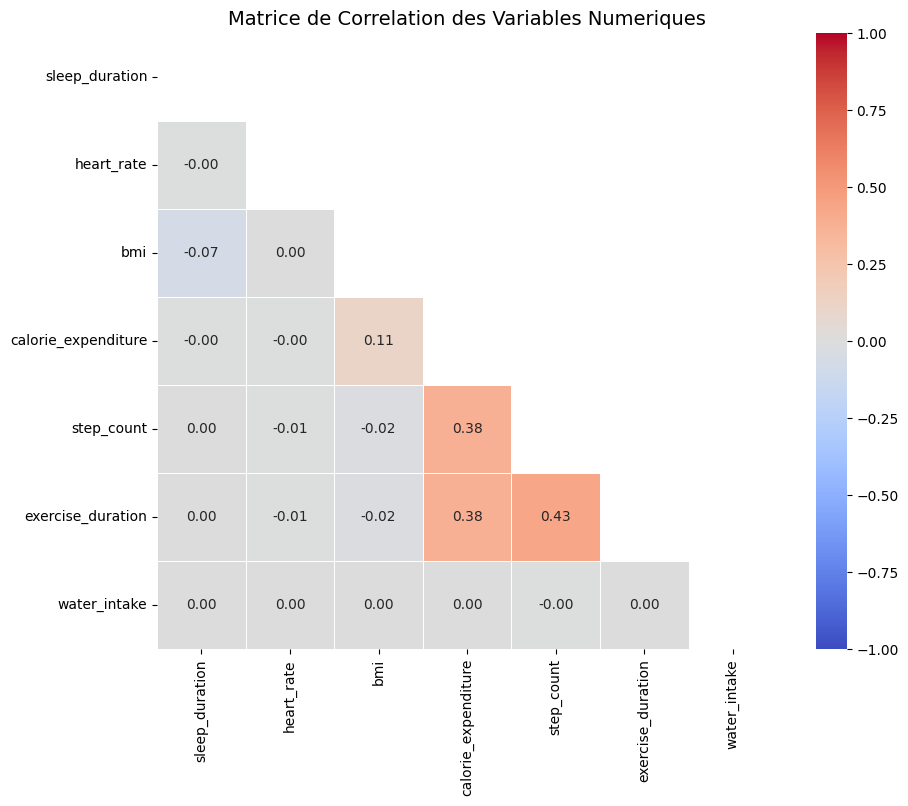

In [22]:
# Selection des colonnes numeriques
numeric_df = train_new.select_dtypes(include=['float64', 'int64'])

plt.figure(figsize=(10, 8))

# Masque pour ne garder que le triangle inferieur
mask = np.triu(np.ones_like(numeric_df.corr(), dtype=bool))

# Affichage du Heatmap
sns.heatmap(
    numeric_df.corr(), 
    mask=mask, 
    annot=True, 
    fmt=".2f", 
    cmap='coolwarm', 
    vmin=-1, vmax=1, 
    linewidths=0.5
)

plt.title('Matrice de Correlation des Variables Numeriques', fontsize=14)
plt.show()

In [23]:
from sklearn.model_selection import train_test_split, StratifiedGroupKFold, cross_validate
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import matthews_corrcoef, balanced_accuracy_score, cohen_kappa_score, log_loss

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
#from catboost import CatBoostClassifier
import time

# 6. Model Selection

Le choix d'un modele de Machine Learning ne doit pas etre arbitraire. Il depend a la fois des caracteristiques du probleme a resoudre et des proprietes du jeu de donnees. Avant de selectionner un algorithme, il est donc necessaire d'analyser les contraintes du projet afin d'identifier les modeles les plus adaptes.

## 6.1 Problem Characteristics

Le probleme etudie consiste a predire la variable **`health_condition`**, qui prend l'une des trois valeurs suivantes :

- **Fit**
- **At-Risk**
- **Unhealthy**

Il s'agit donc d'un probleme de **classification multiclasse supervisee**.

Par ailleurs, le jeu de donnees presente plusieurs caracteristiques importantes :

| Characteristic | Observation |
|----------------|-------------|
| Learning task | Multiclass Classification |
| Number of observations | 690,088 |
| Number of features | 14 (after removing `id`) |
| Numerical features | 7 |
| Categorical features | 6 |
| Missing values | Imputed during Data Cleaning |
| Class imbalance | Yes (`At-Risk` ≈ 86%) |
| Dataset type | Structured (Tabular Data) |

Ces caracteristiques permettent d'ecarter certains algorithmes moins adaptes. Par exemple, les methodes basees sur les plus proches voisins (KNN) deviennent tres coûteuses sur un jeu de donnees de cette taille, tandis que les modeles lineaires risquent de ne pas capturer les relations non lineaires existant entre les variables.

Les methodes de **Gradient Boosting** constituent aujourd'hui l'une des familles d'algorithmes les plus performantes pour les donnees tabulaires. Elles offrent generalement un excellent compromis entre precision, robustesse et capacite a modeliser des interactions complexes entre les variables.


## 6.2 Candidate model
Pour cette raison, cette etude se concentre sur quatre algorithmes de boosting largement utilises en pratique :

- **HistGradientBoosting**
- **XGBoost**
- **LightGBM**
- **CatBoost**

Ces modeles presentent des caracteristiques complementaires :

| Model | Main Advantages | Potential Limitations |
|--------|-----------------|----------------------|
| **HistGradientBoosting** | Native Scikit-learn implementation, fast training, efficient on large datasets | Fewer optimization options than specialized boosting libraries |
| **XGBoost** | Excellent predictive performance, highly configurable, proven effectiveness in many Kaggle competitions | Higher computational cost and longer training time |
| **LightGBM** | Extremely fast on large datasets, memory efficient, excellent scalability | May overfit if hyperparameters are not properly tuned |
| **CatBoost** | Native support for categorical variables, robust against overfitting, minimal preprocessing required | Slightly slower training on very large datasets |

## 6.3 Evaluation Strategy
Plutôt que de supposer qu'un algorithme est meilleur qu'un autre, les quatre modeles seront entraînes dans les memes conditions experimentales. Leur comparaison reposera sur plusieurs criteres :

- les performances de classification ;
- la capacite a reconnaître les classes minoritaires ;
- le temps d'entraînement ;
- le temps de prediction ;
- la robustesse face au desequilibre des classes.

Le modele offrant le meilleur compromis entre ces differents criteres sera retenu pour la phase d'optimisation des hyperparametres.

## 6.4 Model Comparison Evaluation Metrics
Le choix des metrics d'evalution est une etapes essentielle dans un probleme de classification multivarie. Dans notre jeu de donnees, la variables cible est fortement desequilibre, avec avec près de **86 %** des observations appartenant a la classe **At-Risk**.

Dans ce contexte, des metrics classification tel que accuracy peut nous conduire a des interpretation eronne de notre modele.

On a selection parmi tant d'autre les metrics ci-dessous. 

### a. Matthews Correlation Coefficient (MCC)
C'est une mesure globale de la qualite d'un claddifier. contrairement a l'accuracy, il exploite l'ensemvle de la matrice de confusion et fournit une evalution equilibre meme lorsque les classe sont desequilibre

Pour probleme binaire, le MCC est defini par : 

$$
\text{MCC} = \frac{TP \times TN - FP \times FN}{\sqrt{(TP+FP)(TP+FN)(TN+FP)(TN+FN)}}
$$


en cas d'analyse multivarie, une evaluation de la matrice de confusion complete est effectuer

**Interpretation**

| Valeur | Signification |
|---------|---------------|
| +1 | Classification parfaite |
| 0 | Performance équivalente au hasard |
| -1 | Classification totalement incorrecte |

### b. Balanced Accurary 
Cette metric est celle propose par la competitions il s'agit de la moyenne des recall sur les classer. Elle est definie par :
$$
\text{Balanced Accuracy (BACC)} = \frac{\left(\dfrac{TP}{TP+FN}\right) + \left(\dfrac{TN}{TN+FP}\right)}{2}
$$

où :

$$
\frac{TP}{TP+FN} = \text{True Positive Rate (TPR) ou Sensitivity}
$$

$$
\frac{TN}{TN+FP} = \text{True Negative Rate (TNR) ou Specificity}
$$

cette metric donne le meme poids a chaque classe et permet donc de limiter l'influence de la classe majoritaire

**Interpretation**

- proche de **1** : excellente reconnaissance de toutes les classes ;
- proche de **0** : mauvaises performances globales.


### c. Cohen's Kappa Score 
Il mesure le degre d'accord entre les prediction du modele et les veritable etiquettes.
$$
\kappa = \frac{p_o - p_e}{1 - p_e}
$$

où :

- $p_o$ : **Observed agreement** — à quelle frequence les deux evaluateurs ont pris la meme decision
- $p_e$ : **Expected agreement** — l'accord qu'on obtiendrait par pur hasard
**Interpretation**

| Valeur | Niveau d'accord |
|---------|-----------------|
| < 0 | Accord inférieur au hasard |
| 0 – 0.20 | Faible |
| 0.21 – 0.40 | Moyen |
| 0.41 – 0.60 | Modere |
| 0.61 – 0.80 | Important |
| 0.81 – 1.00 | Presque parfait |

### d. LogLoss(Cross-Entropy Loss)

Evalue la qualite des probabilite predite par le modele. Contrairement au metrics bases unique sur la classe predite, cette mesure penalise fortement les prediction realisees avec une grande confiance lorsqu'elles sont incorrectes


$$
LogLoss = -\frac{1}{N}\sum_{i=1}^{N} \left( y_i \cdot \log(p_i) + (1 - y_i) \cdot \log(1 - p_i) \right)
$$

Where:

- $N$ is the number of observations.
- $y_i$ is the actual binary outcome (0 or 1) for the i-th observation.
- $p_i$ is the predicted probability that the i-th observation belongs to class 1.


**Interpretation**

- plus la valeur est proche de **0**, meilleure est la qualité des probabilités estimées ;
- une valeur élevée indique des probabilités mal calibrées ou des prédictions très confiantes mais incorrectes.




In [24]:
#  Data preparation 
feature = train_new.drop(['health_condition'], axis=1)
target = train_new['health_condition']
 
    
    # Feature prepocessing
for encode in train_cat.drop(['health_condition'], axis=1).columns:
    encoded = LabelEncoder()
    feature[encode] = encoded.fit_transform(feature[encode])

X = feature

y = encoded.fit_transform(target)
class_name = encoded.classes_ # Contient les modalite de la cible sous forme non encoder


    # Split stratifie
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.2, stratify=y, random_state=42)


# Modele candidats 
models = {
    'HistGradientBoosting': HistGradientBoostingClassifier(random_state=42),
    'XGBoost': XGBClassifier(random_state=42),
    'LightGBM': LGBMClassifier(random_state=42, verbose=-1),
    #'CatBoost': CatBoostClassifier(random_state=42, verbose=0)
}


# Metric choisis
def metric_(model,y_true, y_pred_labels, y_pred_proba):
    return {
        'MCC': matthews_corrcoef(y_true, y_pred_labels),
        'BA': balanced_accuracy_score(y_true, y_pred_labels),
        'CKP': cohen_kappa_score(y_true, y_pred_labels),
        'LgL': log_loss(y_true, y_pred_proba, labels=model.classes_),
    }

# Entraine + Evalution
results = []

for name, model in models.items():
    start = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start

    train_metrics = metric_(model, y_train, model.predict(X_train), model.predict_proba(X_train))
    val_metrics = metric_(model, y_val, model.predict(X_val), model.predict_proba(X_val))

    results.append({
        'model' : name,
        'train_time(s)' : round(train_time,2),
        'MCC_train' : round(train_metrics['MCC'], 4),
        'MCC_val' : round(val_metrics['MCC'],4),
        'BA_train' : round(train_metrics['BA'], 4),
        'BA_val' : round(val_metrics['BA'],4),
        'CKP_train' : round(train_metrics['CKP'], 4),
        'CKP_val' : round(val_metrics['CKP'],4),
        'LgL_train' : round(train_metrics['LgL'], 4),
        'LgL_val' : round(val_metrics['LgL'],4),
    })
results_data = pd.DataFrame(results).sort_values('MCC_val', ascending=False)
results_data


,model,train_time(s),MCC_train,MCC_val,BA_train,BA_val,CKP_train,CKP_val,LgL_train,LgL_val
1,XGBoost,13.74,0.8663,0.8590,0.8651,0.8603,0.8615,0.8541,0.0983,0.1127
2,LightGBM,8.42,0.8592,0.8578,0.8596,0.8589,0.8541,0.8528,0.1045,0.1127
0,HistGradientBoosting,7.67,0.8569,0.8554,0.8586,0.8578,0.8519,0.8504,0.1083,0.1145


### Interpretation of Model 

Les trois algorithme de boosting ont ete entrainer avec leur hyperparametre par defaut afin d'etablir une premiere reference de performance avant l'optimisation 

| Model | Training Time (s) | MCC (Val) | Balanced Accuracy (Val) | Cohen's Kappa (Val) | Log Loss (Val) |
|--------|------------------:|----------:|------------------------:|--------------------:|---------------:|
| XGBoost | 9.63 | **0.8590** | **0.8603** | **0.8541** | **0.1127** |
| LightGBM | 5.28 | 0.8578 | 0.8589 | 0.8528 | **0.1127** |
| HistGradientBoosting | **3.31** | 0.8554 | 0.8578 | 0.8504 | 0.1145 |

### Training performance 
Les performations obtenue sur l'ensemble d'entrainement sont tres proches pour les 3 modele. Les valeur de MCC de BA, et de CKP sont toutes comprises entre **0.85** et **0.87**, indiquant une bonne capacite d'apprentissage.

XGBoost obtient les meilleur resultats sur les donnees d'entrainement avec un **MCC de 0.8663**, une **Balanced Accuracy de 0.8651** et un **Cohen's Kappa de 0.8615**, touten presentantn le plus faible Log Loss (**0.0983**)


### Generalization Performance 
Les performances Observees sur l'ensemble de validation reste tres proche de celle obtenue a l'entrainement. La faible difference entre les ensemble montre que les trois modeles generealise correctement sur des donnees jamais vues. Ces ecarts tres faibles suggerent l'abscence de surapprentissage significatif. 

### Computational efficieency
Le temps d'entrainement des modeles suit l'ordre suivant : 
HistGradientBoosting < LightGBM < XGBoost

Autrement dit : 
- HistGradientBoosting est le plus rapide ;
- LightGBM offre un excellent compromis entre rapidite et precision ;
- XGBoost est le plus precis mais egalement le plus couteux en calcul.

### Conclusion 
Les trois models present d'execellentes performances de classification et une bonne capacite de generalisation. Bien que le **XGBoost** obtienne les meilleur resultat syr les metriques d'evaluation, l'ecart avec **LightGBM** reste tres faible. compte tenu de sont temps d'entrainement nettrement inferieur, **LightGBM apparait comme le meilleur compromis entre performance predictive et efficacite computationnelle**. C'est dont le **LightGBM sera retenu pour la phase d'optimisation des hyperparametres**,

# 7. Hyperparamatre Analysis and Optimization 
## 7.1 Objective 

Apres la selectiondu model LightGBM comme meilleur compris. Cette etape consist a analyses l'influence des hyperparametre sur le comportement du modele.

les performance d'un modele de boosting dependent de parametre utilises lors de sont entrainement. Des parametres mal configure peuvent conduire a 

- un overfitting 
- un underfitting 
- temps d'execution exhaustif

L'objectif de cette etude est donc double : 
1. Identifier les hyperparametre ayant le plus d'impact sur les performance du model;
2. Determiner les valeurs permettant d'obtenir le meilleur compromis entre capacite d'apprentissage et de generalisation 

## 7.2 Experimental Methodology

Pour chaque hyperparametre etudie, plusieurs valeurs condidates seront testees individuellement. Le porcess est le suivant : 

1. Fixer une configuration de reference de lightGBM;
2. Entrainer le model pour chaque valeur 
3. evaluer les performance obtenu
4. visualiser

## 7.3 Hyperparameter categorie

les hyperparamtre etudies sont regroupes selon leur role dans l'algorithme lightGBM

### 7.3.1 Boosting parameters

C'est le parametre contrle le processus general de construction des arbres 
| Hyperparameter | Description |
|----------------|-------------|
| `n_estimators` | Nombre total d'arbres construits pendant l'apprentissage |
| `learning_rate` | Taux d'apprentissage appliqué à chaque nouvel arbre |


### 7.3.2 Tress Structure Parameter

Ces paramatres controlent la complexite des arbres de decision
| Hyperparameter | Description |
|----------------|-------------|
| `num_leaves` | Nombre maximal de feuilles par arbre |
| `max_depth` | Profondeur maximale autorisée pour chaque arbre |
| `min_child_samples` | Nombre minimal d'observations nécessaire dans une feuille |


### 7.3.3 GOSS Parameters 

lightGBM utilise l'algorithm **Gradient-based One-Side Sampling (GOSS)**  afin de reduire le cout computationnel tout en conservant les observation des plus informative 

GOSS selection : 
- les observation possedant les gradiant les plus eleves;
- un echantillons aleatoire parmi les observation ayant des gradiant plus faible.

#### Formula

$$
\tilde{V}_{j}(d)=\frac{1}{n}\left(\frac{\left(\sum_{x_{i}\in A_{l}}g_{i}+\frac{1-a}{b}\sum_{x_{i}\in B_{l}}g_{i}\right)^{2}}{n_{l}(d)}+\frac{\left(\sum_{x_{i}\in A_{r}}g_{i}+\frac{1-a}{b}\sum_{x_{i}\in B_{r}}g_{i}\right)^{2}}{n_{r}(d)}\right)
$$

## Fonctionnement des composants de la formule

* **\(g_i\)** : Le gradient (résidu) de la fonction de perte pour l'instance i.
* **Set A** : Le sous-ensemble des données gardé avec les plus grands gradients (proportion a).
* **Set B** : Le sous-ensemble échantillonné aléatoirement parmi les données ayant les plus petits gradients (proportion b).
* **\(\frac{1-a}{b}\)** : Le facteur de pondération (poids de correction) appliqué aux petits gradients du set B pour compenser le sous-échantillonnage.
* **\(A_l, B_l\) et \(A_r, B_r\)** : Les sous-ensembles séparés à gauche (l) et à droite (r) par le point de coupure d.
* **\(n_l(d)\) et \(n_r(d)\)** : Les nombres d'instances après la division dans les branches gauche et droite.
* **n** : Le nombre total d'échantillons combinés du sous-ensemble réduit (\(A \cup B\)).

| Hyperparameter | Description |
|----------------|-------------|
| `top_rate` | Proportion des observations conservées parmi celles avec les gradients les plus élevés |
| `other_rate` | Proportion des observations sélectionnées aléatoirement parmi les gradients faibles |


### 7.3.4 Exclusive Fearure bundling (EFB) parameter 

LightGBM utilise la technique de EFB afin de reduire la reduire la dimension effective des donnees 

le parametre etudie :
| Hyperparameter | Description |
|----------------|-------------|
| `max_bin` | Nombre maximal de compartiments utilisés pour discrétiser les variables continues |


### 7.3.5 Regularization Parametr

Les parametres de regularisation permettent de controler la complexite du modeleet de limite le surapprentissage
| Hyperparameter | Description |
|----------------|-------------|
| `reg_alpha` | Régularisation L1 appliquée aux poids des feuilles |
| `reg_lambda` | Régularisation L2 appliquée aux poids des feuilles |
| `min_split_gain` | Gain minimal nécessaire pour effectuer une séparation 


## 7.4 Experimental results Tracking 


Afin de sauvegarde l'ensemble des experiences realisees, chaque entrainement sera enregistre dans le fichier .csv; La structure du fichier est la suivante :

| ID | n_estimators | learning_rate | num_leaves | max_depth | min_child_samples | top_rate | other_rate | max_bin | reg_alpha | reg_lambda | min_split_gain | MCC_train | MCC_val | BA_train | BA_val | CKP_train | CKP_val | LogLoss_train | LogLoss_val | Training_time |
|----|--------------|---------------|------------|-----------|-------------------|----------|------------|---------|------------|------------|----------------|-----------|---------|----------|--------|-----------|---------|---------------|--------------|---------------|

Le fichier sera sauvegarde sous le nom :

```
lightgbm_hyperparameter_results.csv
```

In [ ]:
baseline_params = {
    'boosting_type': 'goss',       
    'n_estimators': 100,           
    'learning_rate': 0.1,         
    'num_leaves': 31,             
    'max_depth': -1,               
    'min_child_samples': 20,      
    'top_rate': 0.2,               
    'other_rate': 0.1,            
    'max_bin': 255,               
    'reg_alpha': 0.0,            
    'reg_lambda': 0.0,             
    'min_split_gain': 0.0,         
    'random_state': 42,            
    'n_jobs': -1,                  
    'verbose': -1                  
}

In [ ]:
# Selection des hyperparametre 

param_grid = {
    'n_estimators': [150, 200, 250],
    'learning_rate': [0.1, 0.2, 0.3],
    #'num_leaves': [8, 16, 32, 48, 64],
    'max_depth': [-5, -10, -15],
    #'min_child_samples': [5, 10, 20, 30, 50],
    'top_rate': [0.2, 0.3, .4],
    'other_rate': [0.1, 0.3, 0.5],
    'max_bin': [255, 300, 350],
    # 'reg_alpha': [0, 1, 5],
    # 'reg_lambda': [0, 1, 5],
    #'min_split_gain': [0, 0.5, 1, 5, 10,],
}

csv_name = "lightgbm_hyperparameter_results.csv"
results = []
experience_id = 1

In [ ]:
for param_type, values in param_grid.items():
    for val in values:
        current_config = baseline_params.copy()
        current_config[param_type] = val
        if current_config['top_rate'] + current_config['other_rate'] >= 1.0: #car top_rate + other_rate  = 100%
            continue
       
        start_time = time.time()
        model = LGBMClassifier(**current_config)
        model.fit(X_train, y_train)
        training_time = round(time.time() - start_time, 4)
        
        y_pred_train = model.predict(X_train)
        y_pred_val = model.predict(X_val)
        
        y_proba_train = model.predict_proba(X_train)
        y_proba_val = model.predict_proba(X_val)
        
        mcc_tr = matthews_corrcoef(y_train, y_pred_train)
        mcc_va = matthews_corrcoef(y_val, y_pred_val)
        
        ba_tr = balanced_accuracy_score(y_train, y_pred_train)
        ba_va = balanced_accuracy_score(y_val, y_pred_val)
        
        ckp_tr = cohen_kappa_score(y_train, y_pred_train)
        ckp_va = cohen_kappa_score(y_val, y_pred_val)
        
        ll_tr = log_loss(y_train, y_proba_train)
        ll_va = log_loss(y_val, y_proba_val)

        row = {
            'ID': experience_id,
            'tested_param': param_type,
            'param_value': str(val),
            'n_estimators': current_config['n_estimators'],
            'learning_rate': current_config['learning_rate'],
            #'num_leaves': current_config['num_leaves'],
            'max_depth': current_config['max_depth'],
            #'min_child_samples': current_config['min_child_samples'],
            'top_rate': current_config['top_rate'],
            'other_rate': current_config['other_rate'],
            'max_bin': current_config['max_bin'],
            # 'reg_alpha': current_config['reg_alpha'],
            # 'reg_lambda': current_config['reg_lambda'],
            #'min_split_gain': current_config['min_split_gain'],
            'MCC_train': round(mcc_tr, 4),
            'MCC_val': round(mcc_va, 4),
            'BA_train': round(ba_tr, 4),
            'BA_val': round(ba_va, 4),
            'CKP_train': round(ckp_tr, 4),
            'CKP_val': round(ckp_va, 4),
            'LogLoss_train': round(ll_tr, 4),
            'LogLoss_val': round(ll_va, 4),
            'Training_time': training_time
        }

        results.append(row)
        experience_id += 1

# Création du DataFrame et enregistrement CSV
df_results = pd.DataFrame(results)
df_results.to_csv(csv_name, index=False)



In [42]:
best_exp = df_results.loc[df_results['MCC_val'].idxmax()]

print(" SÉLECTION FINALE DU MEILLEUR CONFIGURATION")

print(f"Meilleure expérience ID : {best_exp['ID']}")
print(f"Meilleur MCC Validation  : {best_exp['MCC_val']}")
print(f"Balanced Accuracy Val   : {best_exp['BA_val']}")
print(f"Cohen's Kappa Val       : {best_exp['CKP_val']}")
print(f"LogLoss Validation      : {best_exp['LogLoss_val']}")
print(f"Temps d'entraînement    : {best_exp['Training_time']} sec")
print("\nHyperparamètres sélectionnés :")
print(f"- n_estimators     : {best_exp['n_estimators']}")
print(f"- learning_rate    : {best_exp['learning_rate']}")
#print(f"- num_leaves       : {best_exp['num_leaves']}")
print(f"- max_depth        : {best_exp['max_depth']}")
#print(f"- min_child_samples: {best_exp['min_child_samples']}")
print(f"- top_rate         : {best_exp['top_rate']}")
print(f"- other_rate       : {best_exp['other_rate']}")
print(f"- max_bin          : {best_exp['max_bin']}")
# print(f"- min_split_gain   : {best_exp['min_split_gain']}")

 SÉLECTION FINALE DU MEILLEUR CONFIGURATION
Meilleure expérience ID : 18
Meilleur MCC Validation  : 0.8586
Balanced Accuracy Val   : 0.8588
Cohen's Kappa Val       : 0.8535
LogLoss Validation      : 0.1123
Temps d'entraînement    : 25.1547 sec

Hyperparamètres sélectionnés :
- n_estimators     : 100
- learning_rate    : 0.1
- max_depth        : -1
- top_rate         : 0.2
- other_rate       : 0.1
- max_bin          : 350
